# Preprocessing Kidney Cancer Data

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Input & output paths
input_path = "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer"
output_path = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data/Kidney Cancer"

# Target size
target_size = (224, 224)

# Loop recursively through all files
for root, dirs, files in os.walk(input_path):
    for filename in tqdm(files, desc=f"Processing folder {root}"):
        file_path = os.path.join(root, filename)
        
        # Skip if not a file
        if not os.path.isfile(file_path):
            continue

        # Create corresponding output folder
        relative_path = os.path.relpath(root, input_path)
        save_dir = os.path.join(output_path, relative_path)
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)

        try:
            # Read image in grayscale
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

            if img is None:
                print(f"⚠️ Skipping {file_path}: not a valid image")
                continue

            # Resize
            img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)

            # Denoise (Gaussian blur)
            img = cv2.GaussianBlur(img, (3, 3), 0)

            # CLAHE
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            img = clahe.apply(img)

            # Normalize intensity to 0-1
            img = img.astype(np.float32) / 255.0

            # Convert back to 0-255 for saving
            img_to_save = (img * 255).astype(np.uint8)

            # Save to output folder
            cv2.imwrite(save_path, img_to_save)

        except Exception as e:
            print(f"⚠️ Skipping {file_path}: {e}")

print("\n✅ All Kidney Cancer images preprocessed and saved successfully!")


Processing folder /Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer: 0it [00:00, ?it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer/Tumor: 100%|██████████| 2283/2283 [00:01<00:00, 1327.11it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer/Cyst: 100%|██████████| 3709/3709 [00:02<00:00, 1360.05it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer/Stone: 100%|██████████| 1377/1377 [00:01<00:00, 1253.75it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer/Normal: 100%|██████████| 5077/5077 [00:03<00:00, 1333.03it/s]


✅ All Kidney Cancer images preprocessed and saved successfully!


## Sample Data

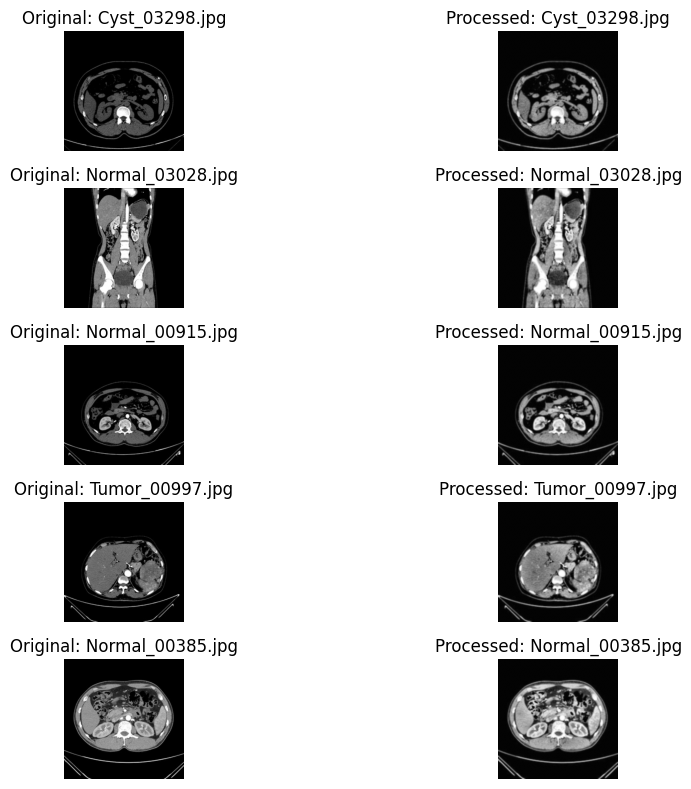

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random

# Paths
original_path = "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer"
processed_path = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data/Kidney Cancer"

# --- Get all images recursively ---
def get_all_images(folder):
    image_files = []
    for root, _, files in os.walk(folder):
        for f in files:
            if f.lower().endswith(('.jpg', '.jpeg', '.png', '.tif', '.bmp')):
                rel_path = os.path.relpath(os.path.join(root, f), folder)
                image_files.append(rel_path)
    return image_files

original_files = get_all_images(original_path)
processed_files = get_all_images(processed_path)

# Only keep files that exist in both original and processed
common_files = list(set(original_files) & set(processed_files))

# Sample 5 random images
sample_files = random.sample(common_files, min(5, len(common_files)))

# Plot
plt.figure(figsize=(12, 8))

for i, rel_path in enumerate(sample_files):
    orig_img = cv2.imread(os.path.join(original_path, rel_path), cv2.IMREAD_GRAYSCALE)
    proc_img = cv2.imread(os.path.join(processed_path, rel_path), cv2.IMREAD_GRAYSCALE)

    # Original
    plt.subplot(5, 2, 2*i + 1)
    plt.imshow(orig_img, cmap='gray')
    plt.title(f"Original: {os.path.basename(rel_path)}")
    plt.axis('off')

    # Processed
    plt.subplot(5, 2, 2*i + 2)
    plt.imshow(proc_img, cmap='gray')
    plt.title(f"Processed: {os.path.basename(rel_path)}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# All Blood Cell Images

In [ ]:
import os
import cv2
import numpy as np

# Input & output base paths
input_base = "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data"
output_base = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data"

# List of main blood cell datasets
datasets = ["Leukemia", "Lung and Colon Cancer", "Lymphoma"]

for dataset in datasets:
    input_path = os.path.join(input_base, dataset)
    output_path = os.path.join(output_base, dataset)
    os.makedirs(output_path, exist_ok=True)

    # Loop through subclasses
    for subclass in os.listdir(input_path):
        subclass_input_path = os.path.join(input_path, subclass)
        subclass_output_path = os.path.join(output_path, subclass)
        os.makedirs(subclass_output_path, exist_ok=True)

        # Loop through images
        for filename in os.listdir(subclass_input_path):
            file_path = os.path.join(subclass_input_path, filename)
            if not os.path.isfile(file_path):
                continue

            try:
                # Read image
                img = cv2.imread(file_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                # Denoise
                img = cv2.GaussianBlur(img, (3,3), 0)

                # CLAHE for contrast enhancement
                lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
                l, a, b = cv2.split(lab)
                clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
                l = clahe.apply(l)
                lab = cv2.merge((l,a,b))
                img = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

                # Normalize 0-1
                img = img.astype(np.float32) / 255.0

                # Convert back 0-255 for saving
                img_to_save = (img * 255).astype(np.uint8)
                save_path = os.path.join(subclass_output_path, filename)
                cv2.imwrite(save_path, cv2.cvtColor(img_to_save, cv2.COLOR_RGB2BGR))

            except Exception as e:
                print(f"⚠️ Skipping {file_path}: {e}")

print("✅ All blood cell images preprocessed successfully!")


✅ All blood cell images preprocessed successfully!


## Sample Images after preprocessing

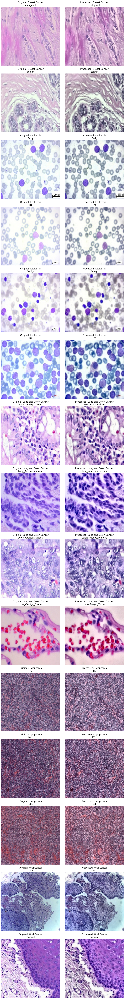

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random

# Base paths
raw_base = "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data"
processed_base = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data"

# Datasets
datasets = ["Breast Cancer", "Leukemia", "Lung and Colon Cancer", "Lymphoma", "Oral Cancer"]

# Collect sample image pairs
samples = []

for dataset in datasets:
    dataset_raw_path = os.path.join(raw_base, dataset)
    dataset_proc_path = os.path.join(processed_base, dataset)

    subclasses = [d for d in os.listdir(dataset_raw_path) if os.path.isdir(os.path.join(dataset_raw_path, d))]

    for subclass in subclasses:
        subclass_raw_path = os.path.join(dataset_raw_path, subclass)
        subclass_proc_path = os.path.join(dataset_proc_path, subclass)

        images = [f for f in os.listdir(subclass_raw_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.tif', '.bmp'))]
        if not images:
            continue

        filename = random.choice(images)
        orig_img = cv2.imread(os.path.join(subclass_raw_path, filename))
        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
        proc_img = cv2.imread(os.path.join(subclass_proc_path, filename))
        proc_img = cv2.cvtColor(proc_img, cv2.COLOR_BGR2RGB)

        samples.append((dataset, subclass, orig_img, proc_img))

# Create figure
num_samples = len(samples)
fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5*num_samples))

for i, (dataset, subclass, orig_img, proc_img) in enumerate(samples):
    axes[i, 0].imshow(orig_img)
    axes[i, 0].set_title(f"Original: {dataset}\n{subclass}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(proc_img)
    axes[i, 1].set_title(f"Processed: {dataset}\n{subclass}")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

## Quality Check

## For Kidney Cancer Data


🔹 Processing dataset: Kidney Cancer
Found 12446 images for analysis in Kidney Cancer.


Analyzing images for Kidney Cancer: 100%|██████████| 12446/12446 [00:27<00:00, 456.18it/s]


✅ Kidney Cancer SSIM - Mean: 0.1773, Std: 0.0505
Kidney Cancer Original - Mean intensity: 37.01, Std: 57.09
Kidney Cancer Processed - Mean intensity: 49.24, Std: 66.23


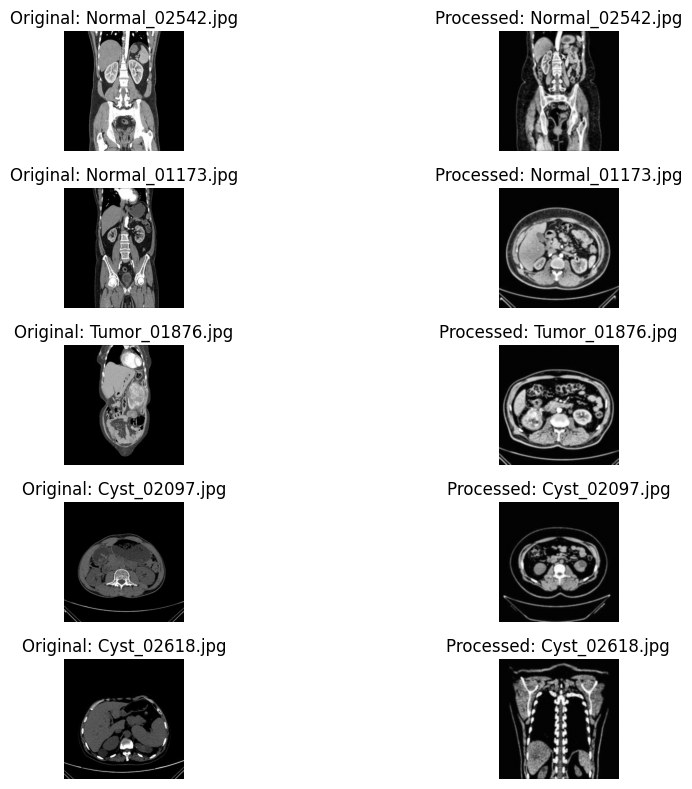

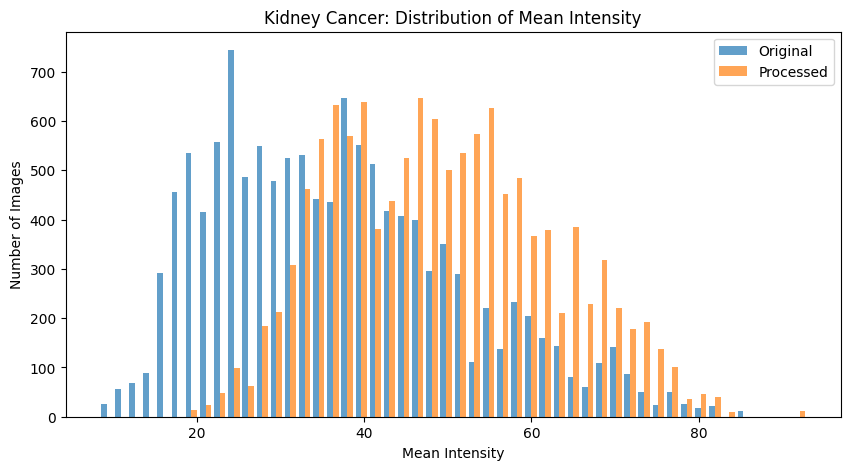


🔹 Processing dataset: Brain Tumor
Found 7019 images for analysis in Brain Tumor.


Analyzing images for Brain Tumor: 100%|██████████| 7019/7019 [00:13<00:00, 513.02it/s]


✅ Brain Tumor SSIM - Mean: 1.0000, Std: 0.0000
Brain Tumor Original - Mean intensity: 47.65, Std: 47.31
Brain Tumor Processed - Mean intensity: 47.65, Std: 47.31


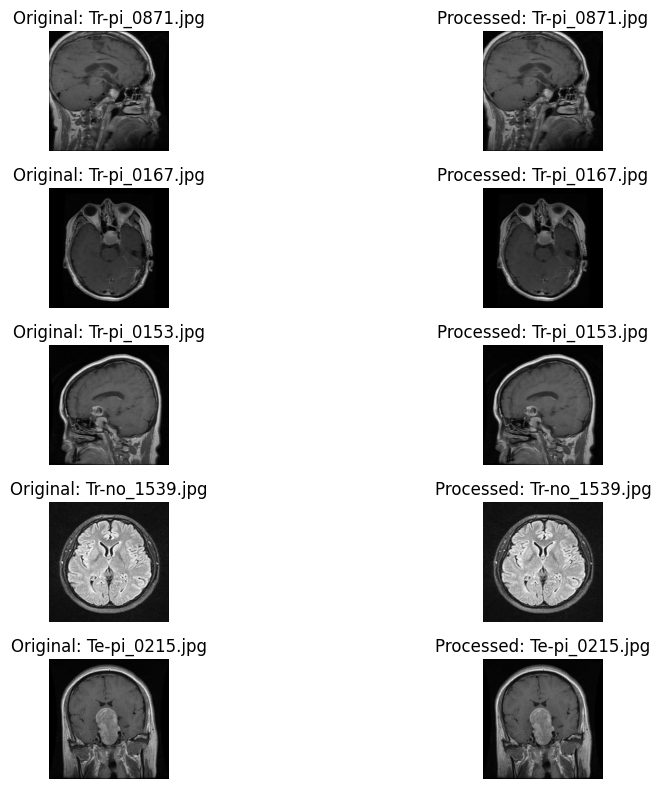

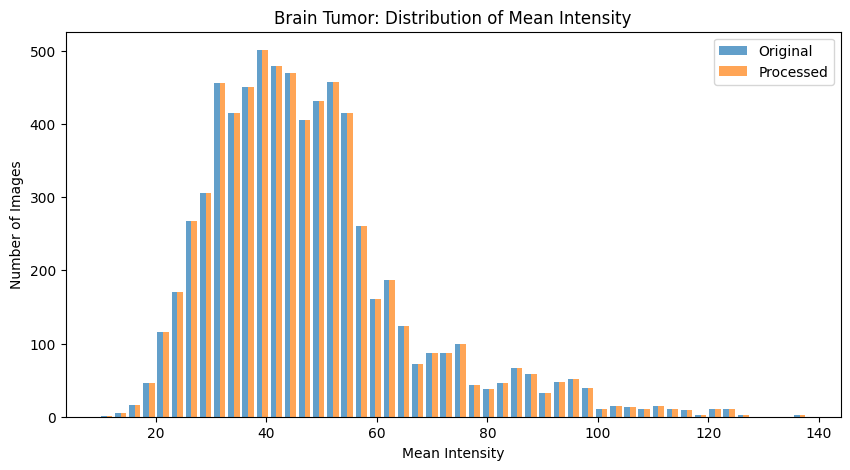


🔹 Processing dataset: Chest X-ray
Found 8546 images for analysis in Chest X-ray.


Analyzing images for Chest X-ray: 100%|██████████| 8546/8546 [00:16<00:00, 512.49it/s]


✅ Chest X-ray SSIM - Mean: 1.0000, Std: 0.0000
Chest X-ray Original - Mean intensity: 122.82, Std: 57.40
Chest X-ray Processed - Mean intensity: 122.82, Std: 57.40


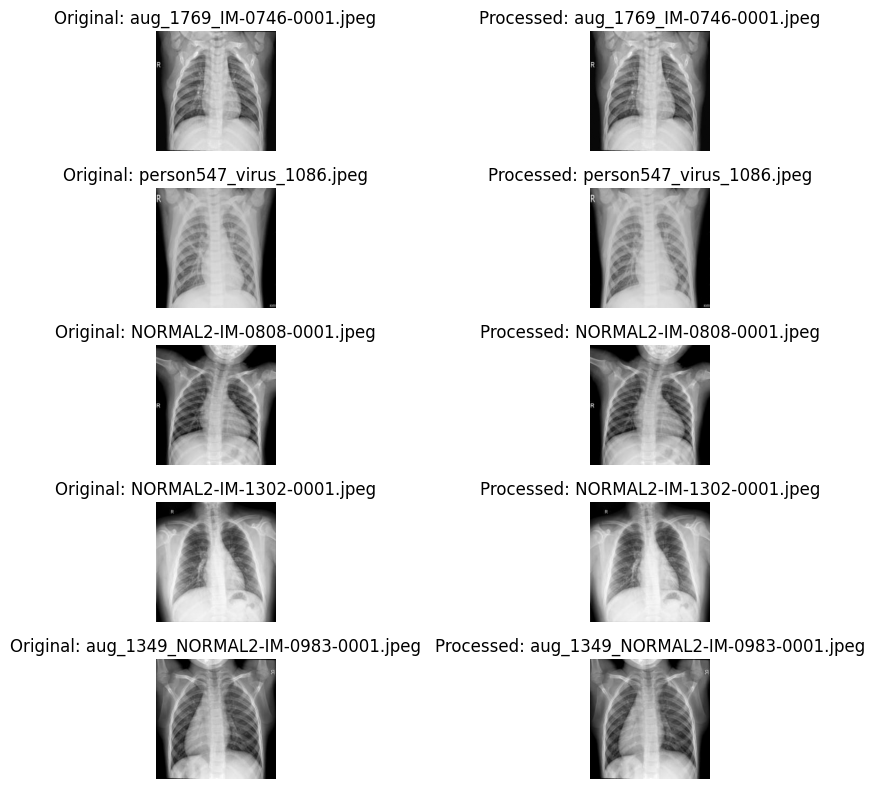

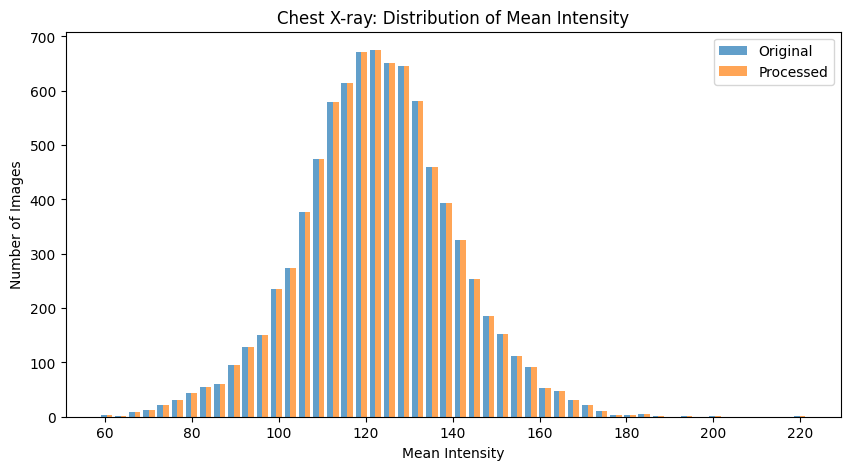

In [1]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

# ===================== Paths =====================
datasets = {
    "Kidney Cancer": {
        "original": "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Kidney Cancer",
        "processed": "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data/Kidney Cancer"
    },
    "Brain Tumor": {
        "original": "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Brain Tumor",
        "processed": "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data/Brain Tumor"
    },
    "Chest X-ray": {
        "original": "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data/Chest_Xray",
        "processed": "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data/Chest_Xray"
    }
}

# ===================== Helper: get all images recursively =====================
def get_all_images(folder):
    image_files = []
    for root, _, files in os.walk(folder):
        for f in files:
            if f.lower().endswith(('.jpg', '.jpeg', '.png', '.tif', '.bmp')):
                rel_path = os.path.relpath(os.path.join(root, f), folder)
                image_files.append(rel_path)
    return image_files

# ===================== Main Processing =====================
for dataset_name, paths in datasets.items():
    print(f"\n🔹 Processing dataset: {dataset_name}")
    original_path = paths["original"]
    processed_path = paths["processed"]

    # Step 1: Load image paths
    original_files = get_all_images(original_path)
    processed_files = get_all_images(processed_path)
    common_files = list(set(original_files) & set(processed_files))
    print(f"Found {len(common_files)} images for analysis in {dataset_name}.")

    # Step 2: Quantitative Analysis
    ssim_values = []
    orig_means, orig_stds = [], []
    proc_means, proc_stds = [], []

    for rel_path in tqdm(common_files, desc=f"Analyzing images for {dataset_name}"):
        orig = cv2.imread(os.path.join(original_path, rel_path), cv2.IMREAD_GRAYSCALE)
        proc = cv2.imread(os.path.join(processed_path, rel_path), cv2.IMREAD_GRAYSCALE)

        # Resize original to match processed
        if orig.shape != proc.shape:
            orig = cv2.resize(orig, (proc.shape[1], proc.shape[0]))

        # SSIM
        ssim_values.append(ssim(orig, proc))

        # Intensity statistics
        orig_means.append(np.mean(orig))
        orig_stds.append(np.std(orig))
        proc_means.append(np.mean(proc))
        proc_stds.append(np.std(proc))

    # Summary
    print(f"✅ {dataset_name} SSIM - Mean: {np.mean(ssim_values):.4f}, Std: {np.std(ssim_values):.4f}")
    print(f"{dataset_name} Original - Mean intensity: {np.mean(orig_means):.2f}, Std: {np.mean(orig_stds):.2f}")
    print(f"{dataset_name} Processed - Mean intensity: {np.mean(proc_means):.2f}, Std: {np.mean(proc_stds):.2f}")

    # Step 3: Visualize 5 Random Images
    sample_files = random.sample(common_files, min(5, len(common_files)))
    plt.figure(figsize=(12, 8))
    for i, rel_path in enumerate(sample_files):
        orig_img = cv2.imread(os.path.join(original_path, rel_path), cv2.IMREAD_GRAYSCALE)
        proc_img = cv2.imread(os.path.join(processed_path, rel_path), cv2.IMREAD_GRAYSCALE)

        plt.subplot(5, 2, 2*i + 1)
        plt.imshow(orig_img, cmap='gray')
        plt.title(f"Original: {os.path.basename(rel_path)}")
        plt.axis('off')

        plt.subplot(5, 2, 2*i + 2)
        plt.imshow(proc_img, cmap='gray')
        plt.title(f"Processed: {os.path.basename(rel_path)}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Step 4: Histogram of Mean Intensities
    plt.figure(figsize=(10,5))
    plt.hist([np.array(orig_means), np.array(proc_means)], bins=50, 
             label=['Original', 'Processed'], alpha=0.7)
    plt.xlabel("Mean Intensity")
    plt.ylabel("Number of Images")
    plt.title(f"{dataset_name}: Distribution of Mean Intensity")
    plt.legend()
    plt.show()

## Blood cell images


=== Dataset: Leukemia ===
Found 3256 images for analysis.


Analyzing images: 100%|██████████| 3256/3256 [00:13<00:00, 246.00it/s]


SSIM - Mean: 0.2071, Std: 0.0607
Original - Mean intensity: 217.80, Std: 32.08
Processed - Mean intensity: 191.50, Std: 53.30


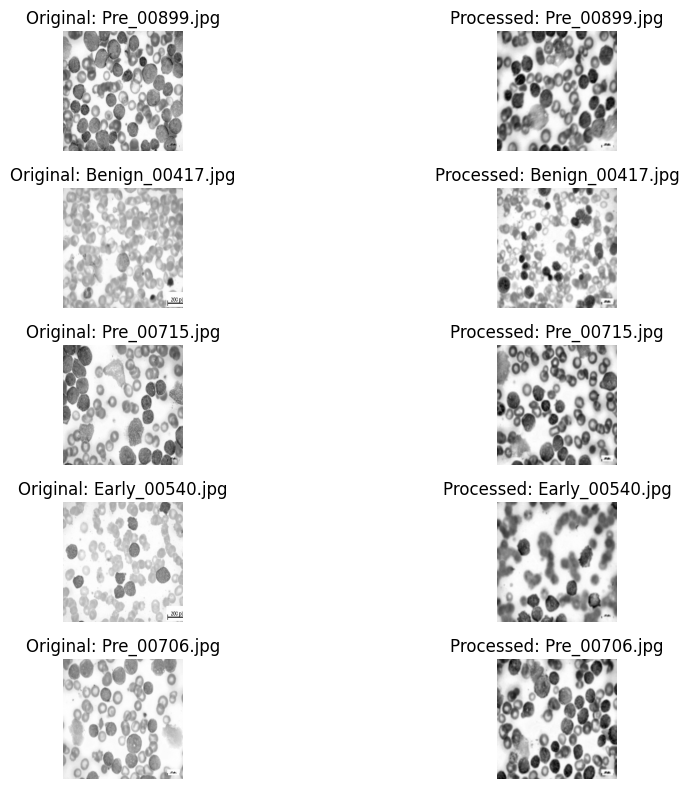

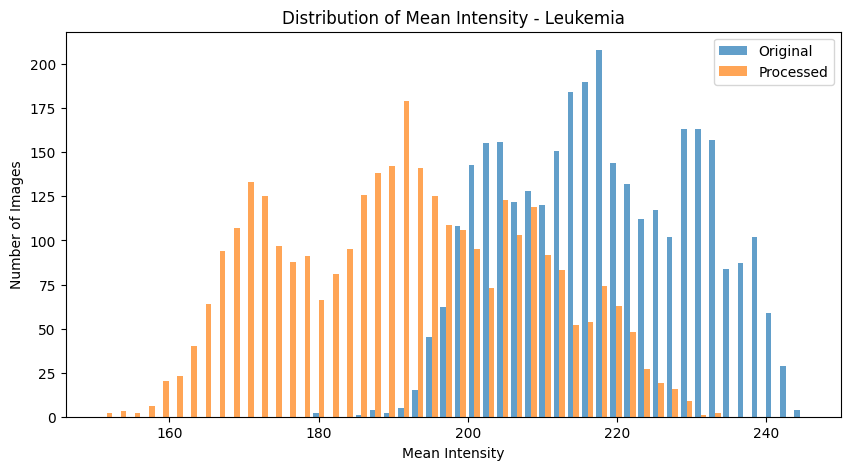


=== Dataset: Lung and Colon Cancer ===
Found 20000 images for analysis.


Analyzing images: 100%|██████████| 20000/20000 [01:23<00:00, 238.29it/s]


SSIM - Mean: 0.5998, Std: 0.3721
Original - Mean intensity: 178.65, Std: 40.14
Processed - Mean intensity: 163.37, Std: 57.79


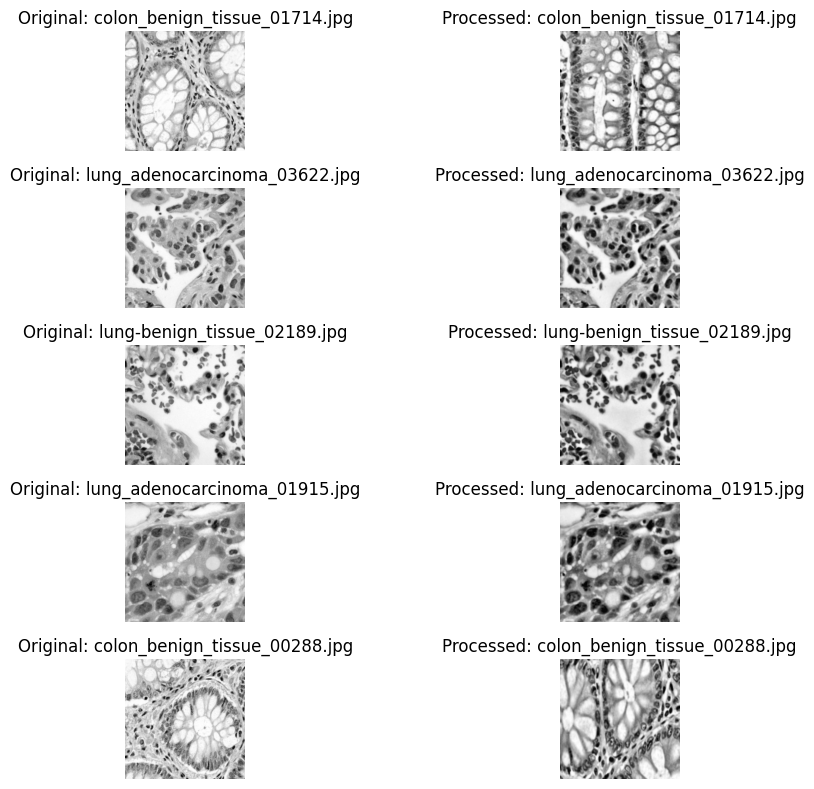

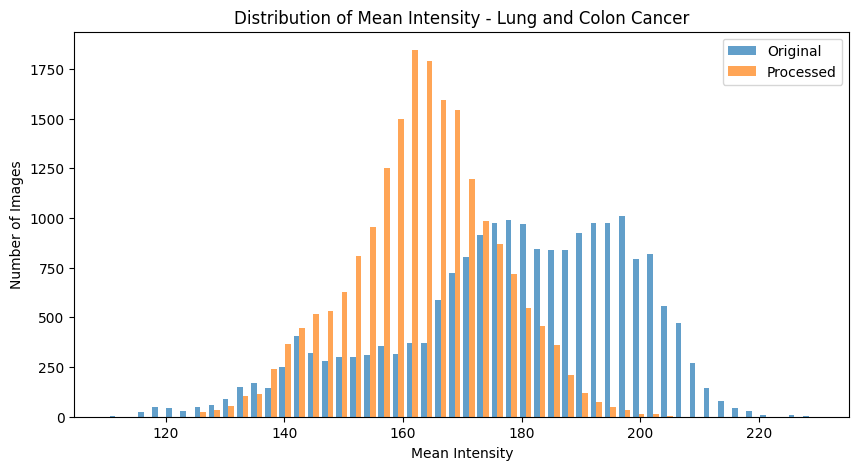


=== Dataset: Lymphoma ===
Found 374 images for analysis.


Analyzing images: 100%|██████████| 374/374 [00:01<00:00, 224.93it/s]


SSIM - Mean: 0.0496, Std: 0.1151
Original - Mean intensity: 107.32, Std: 31.05
Processed - Mean intensity: 119.95, Std: 40.61


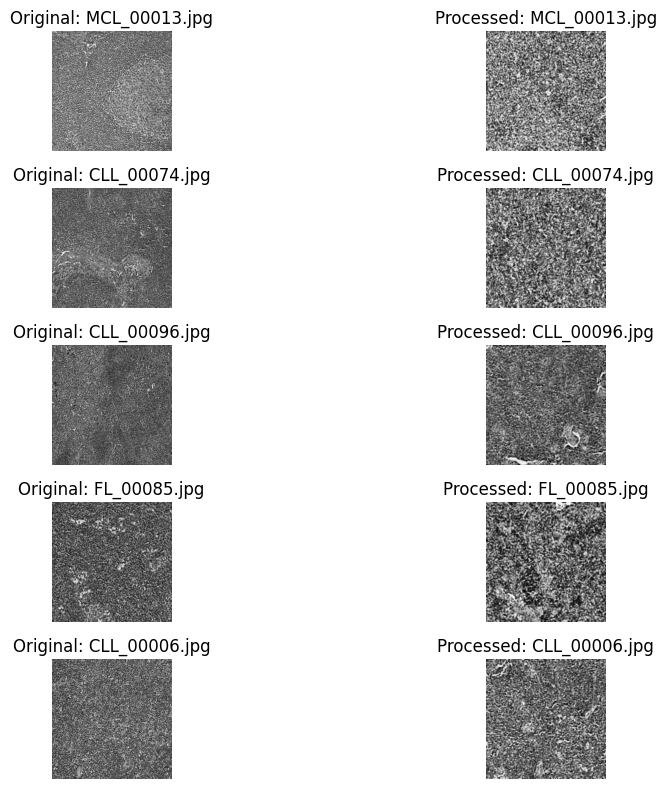

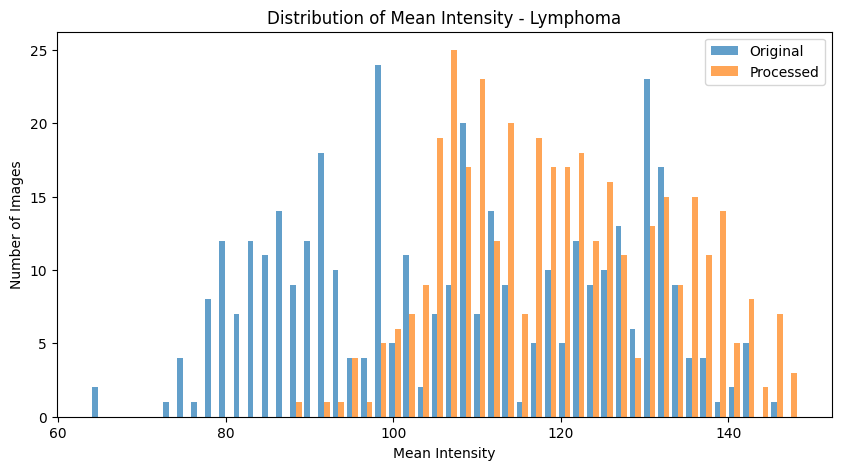

In [2]:
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from tqdm import tqdm

# --- List of datasets ---
datasets = ["Leukemia", "Lung and Colon Cancer", "Lymphoma"]

# --- Base paths ---
base_original = "/Volumes/Sarbajit/Model Optimization/Data/Raw_Data"
base_processed = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data"

# --- SSIM function using OpenCV and numpy (no skimage needed) ---
def ssim_cv2(img1, img2):
    C1 = (0.01*255)**2
    C2 = (0.03*255)**2

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)

    kernel = cv2.getGaussianKernel(11, 1.5)
    window = kernel @ kernel.T

    mu1 = cv2.filter2D(img1, -1, window)[5:-5, 5:-5]
    mu2 = cv2.filter2D(img2, -1, window)[5:-5, 5:-5]

    mu1_sq = mu1**2
    mu2_sq = mu2**2
    mu1_mu2 = mu1*mu2

    sigma1_sq = cv2.filter2D(img1**2, -1, window)[5:-5, 5:-5] - mu1_sq
    sigma2_sq = cv2.filter2D(img2**2, -1, window)[5:-5, 5:-5] - mu2_sq
    sigma12 = cv2.filter2D(img1*img2, -1, window)[5:-5, 5:-5] - mu1_mu2

    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2)) / ((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))
    return ssim_map.mean()

# --- Helper: get all images recursively ---
def get_all_images(folder):
    image_files = []
    for root, _, files in os.walk(folder):
        for f in files:
            if f.lower().endswith(('.jpg', '.jpeg', '.png', '.tif', '.bmp')):
                rel_path = os.path.relpath(os.path.join(root, f), folder)
                image_files.append(rel_path)
    return image_files

# --- Process each dataset ---
for dataset in datasets:
    print(f"\n=== Dataset: {dataset} ===")
    original_path = os.path.join(base_original, dataset)
    processed_path = os.path.join(base_processed, dataset)

    # Load images
    original_files = get_all_images(original_path)
    processed_files = get_all_images(processed_path)
    common_files = list(set(original_files) & set(processed_files))
    print(f"Found {len(common_files)} images for analysis.")

    if len(common_files) == 0:
        continue

    # Quantitative metrics
    ssim_values = []
    orig_means, orig_stds = [], []
    proc_means, proc_stds = [], []

    for rel_path in tqdm(common_files, desc="Analyzing images"):
        orig = cv2.imread(os.path.join(original_path, rel_path), cv2.IMREAD_GRAYSCALE)
        proc = cv2.imread(os.path.join(processed_path, rel_path), cv2.IMREAD_GRAYSCALE)

        if orig.shape != proc.shape:
            orig = cv2.resize(orig, (proc.shape[1], proc.shape[0]))

        ssim_values.append(ssim_cv2(orig, proc))
        orig_means.append(np.mean(orig))
        orig_stds.append(np.std(orig))
        proc_means.append(np.mean(proc))
        proc_stds.append(np.std(proc))

    # Summary
    print(f"SSIM - Mean: {np.mean(ssim_values):.4f}, Std: {np.std(ssim_values):.4f}")
    print(f"Original - Mean intensity: {np.mean(orig_means):.2f}, Std: {np.mean(orig_stds):.2f}")
    print(f"Processed - Mean intensity: {np.mean(proc_means):.2f}, Std: {np.mean(proc_stds):.2f}")

    # Visualize 5 random images
    sample_files = random.sample(common_files, min(5, len(common_files)))
    plt.figure(figsize=(12, 8))
    for i, rel_path in enumerate(sample_files):
        orig_img = cv2.imread(os.path.join(original_path, rel_path), cv2.IMREAD_GRAYSCALE)
        proc_img = cv2.imread(os.path.join(processed_path, rel_path), cv2.IMREAD_GRAYSCALE)

        plt.subplot(5, 2, 2*i + 1)
        plt.imshow(orig_img, cmap='gray')
        plt.title(f"Original: {os.path.basename(rel_path)}")
        plt.axis('off')

        plt.subplot(5, 2, 2*i + 2)
        plt.imshow(proc_img, cmap='gray')
        plt.title(f"Processed: {os.path.basename(rel_path)}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Histogram of mean intensities
    plt.figure(figsize=(10,5))
    plt.hist([np.array(orig_means), np.array(proc_means)], bins=50, 
             label=['Original', 'Processed'], alpha=0.7)
    plt.xlabel("Mean Intensity")
    plt.ylabel("Number of Images")
    plt.title(f"Distribution of Mean Intensity - {dataset}")
    plt.legend()
    plt.show()


# Augmentation

## Kidney Cancer Data

In [ ]:
%pip install -q albumentations

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os
import cv2
import random
import numpy as np
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
import shutil

# --- Paths ---
input_base = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data/Kidney Cancer"
output_base = "/Volumes/Sarbajit/Model Optimization/Data/Augmented/Kidney Cancer"

# --- Classes and target counts ---
class_counts = {
    "Cyst": 3709,
    "Normal": 5077,
    "Stone": 1377,
    "Tumor": 2283
}

# Target count is the size of the largest class
target_count = max(class_counts.values())
print(f"Target count per class: {target_count}")

# --- Safe augmentation pipeline ---
aug = A.Compose([
    A.Rotate(limit=10, p=0.5),                  # small rotation
    A.RandomScale(scale_limit=0.1, p=0.5),     # slight zoom in/out
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0, rotate_limit=0, p=0.5),  # small shift
    A.HorizontalFlip(p=0.5),                   # flip if safe
    A.VerticalFlip(p=0.5),                     # flip if safe
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5)
])

# --- Process each class ---
for cls, count in class_counts.items():
    print(f"\nProcessing class: {cls}")
    input_dir = os.path.join(input_base, cls)
    output_dir = os.path.join(output_base, cls)
    os.makedirs(output_dir, exist_ok=True)

    # Get all images for this class
    images = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg','.png','.jpeg','.tif'))]
    print(f"Original images: {len(images)}")

    # Copy original images first
    for img_name in images:
        shutil.copy2(os.path.join(input_dir, img_name), os.path.join(output_dir, img_name))

    current_count = len(images)
    images_needed = target_count - current_count
    print(f"Images to generate via augmentation: {images_needed}")

    if images_needed <= 0:
        continue

    # Repeat images and apply augmentation until we reach target_count
    while current_count < target_count:
        img_name = random.choice(images)
        img_path = os.path.join(input_dir, img_name)
        img = cv2.imread(img_path)

        if img is None:
            continue

        # Apply augmentation
        augmented = aug(image=img)['image']

        # Save augmented image
        aug_name = f"{os.path.splitext(img_name)[0]}_aug_{current_count}.png"
        cv2.imwrite(os.path.join(output_dir, aug_name), augmented)

        current_count += 1

    print(f"Final images for class {cls}: {current_count}")


/opt/anaconda3/envs/transformers_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Target count per class: 5077

Processing class: Cyst
Original images: 3709


/opt/anaconda3/envs/transformers_env/lib/python3.11/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Images to generate via augmentation: 1368
Final images for class Cyst: 5077

Processing class: Normal
Original images: 5077
Images to generate via augmentation: 0

Processing class: Stone
Original images: 1377
Images to generate via augmentation: 3700
Final images for class Stone: 5077

Processing class: Tumor
Original images: 2283
Images to generate via augmentation: 2794
Final images for class Tumor: 5077


## Blood Cell Images

In [ ]:
import os
import cv2
import random
import shutil
import numpy as np
from tqdm import tqdm

# ---------------- Paths ----------------
datasets = ["Breast Cancer", "Leukemia", "Lymphoma", "Oral Cancer"]  # skip Lung and Colon Cancer
base_input = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data"
base_output = "/Volumes/Sarbajit/Model Optimization/Data/Augmented"

# ---------------- Safe augmentation function ----------------
def augment_image(img):
    # Rotation ±10°
    angle = random.uniform(-10, 10)
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    img = cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REFLECT)

    # Flips
    if random.random() < 0.5:
        img = cv2.flip(img, 0)  # vertical
    if random.random() < 0.5:
        img = cv2.flip(img, 1)  # horizontal

    # Brightness / contrast
    alpha = random.uniform(0.9, 1.1)  # contrast
    beta = random.uniform(-10, 10)    # brightness
    img = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

    # Optional: small Gaussian noise
    if random.random() < 0.3:
        noise = np.random.normal(0, 5, img.shape).astype(np.uint8)
        img = cv2.add(img, noise)

    return img

# ---------------- Augmentation Loop ----------------
for dataset in datasets:
    print(f"\n=== Dataset: {dataset} ===")
    input_path = os.path.join(base_input, dataset)
    output_path = os.path.join(base_output, dataset)
    os.makedirs(output_path, exist_ok=True)

    # Get all classes
    classes = [d for d in os.listdir(input_path) if os.path.isdir(os.path.join(input_path, d))]

    # Count images per class
    class_counts = {cls: len([f for f in os.listdir(os.path.join(input_path, cls)) if f.lower().endswith(('.jpg','.png','.jpeg','.tif'))]) for cls in classes}
    target_count = max(class_counts.values())
    print(f"Target count per class: {target_count}")

    # Process each class
    for cls in classes:
        print(f"\nProcessing class: {cls}")
        cls_input = os.path.join(input_path, cls)
        cls_output = os.path.join(output_path, cls)
        os.makedirs(cls_output, exist_ok=True)

        images = [f for f in os.listdir(cls_input) if f.lower().endswith(('.jpg','.png','.jpeg','.tif'))]

        # Copy original images
        for img_name in images:
            shutil.copy2(os.path.join(cls_input, img_name), os.path.join(cls_output, img_name))

        current_count = len(images)
        images_needed = target_count - current_count
        print(f"Original: {current_count}, need to generate: {images_needed}")

        # Augment until balanced
        while current_count < target_count:
            img_name = random.choice(images)
            img_path = os.path.join(cls_input, img_name)
            img = cv2.imread(img_path)
            if img is None:
                continue

            aug_img = augment_image(img)
            aug_name = f"{os.path.splitext(img_name)[0]}_aug_{current_count}.png"
            cv2.imwrite(os.path.join(cls_output, aug_name), aug_img)
            current_count += 1

        print(f"Final images for class {cls}: {current_count}")



=== Dataset: Breast Cancer ===
Target count per class: 5304

Processing class: malignant
Original: 5304, need to generate: 0
Final images for class malignant: 5304

Processing class: benign
Original: 2479, need to generate: 2825
Final images for class benign: 5304

=== Dataset: Leukemia ===
Target count per class: 985

Processing class: Early
Original: 985, need to generate: 0
Final images for class Early: 985

Processing class: Pro
Original: 804, need to generate: 181
Final images for class Pro: 985

Processing class: Benign
Original: 504, need to generate: 481
Final images for class Benign: 985

Processing class: Pre
Original: 963, need to generate: 22
Final images for class Pre: 985

=== Dataset: Lymphoma ===
Target count per class: 139

Processing class: FL
Original: 139, need to generate: 0
Final images for class FL: 139

Processing class: MCL
Original: 122, need to generate: 17
Final images for class MCL: 139

Processing class: CLL
Original: 113, need to generate: 26
Final image

In [4]:
import os
import cv2
import random
import shutil
import numpy as np
from tqdm import tqdm

# ---------------- Paths ----------------
datasets = ["Leukemia", "Lymphoma"]
base_input = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data"
base_output = "/Volumes/Sarbajit/Model Optimization/Data/Augmented"

# ---------------- Safe augmentation function ----------------
def augment_image(img):
    # Small rotation ±10°
    angle = random.uniform(-10, 10)
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    img = cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REFLECT)

    # Flips
    if random.random() < 0.5:
        img = cv2.flip(img, 0)  # vertical
    if random.random() < 0.5:
        img = cv2.flip(img, 1)  # horizontal

    # Brightness / contrast adjustment
    alpha = random.uniform(0.9, 1.1)  # contrast
    beta = random.uniform(-10, 10)    # brightness
    img = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

    return img

# ---------------- Augmentation Loop ----------------
target_count = 1500  # desired images per class

for dataset in datasets:
    print(f"\n=== Dataset: {dataset} ===")
    input_path = os.path.join(base_input, dataset)
    output_path = os.path.join(base_output, dataset)
    os.makedirs(output_path, exist_ok=True)

    # Get all classes for this dataset
    classes = [d for d in os.listdir(input_path) if os.path.isdir(os.path.join(input_path, d))]

    for cls in classes:
        print(f"\nProcessing class: {cls}")
        cls_input = os.path.join(input_path, cls)
        cls_output = os.path.join(output_path, cls)
        os.makedirs(cls_output, exist_ok=True)

        # List images
        images = [f for f in os.listdir(cls_input) if f.lower().endswith(('.jpg','.png','.jpeg','.tif'))]

        # Copy original images first
        for img_name in images:
            shutil.copy2(os.path.join(cls_input, img_name), os.path.join(cls_output, img_name))

        current_count = len(images)
        images_needed = target_count - current_count
        print(f"Original: {current_count}, need to generate: {images_needed}")

        # Augment until reaching target count
        while current_count < target_count:
            img_name = random.choice(images)
            img_path = os.path.join(cls_input, img_name)
            img = cv2.imread(img_path)
            if img is None:
                continue

            aug_img = augment_image(img)
            aug_name = f"{os.path.splitext(img_name)[0]}_aug_{current_count}.png"
            cv2.imwrite(os.path.join(cls_output, aug_name), aug_img)
            current_count += 1

        print(f"Final images for class {cls}: {current_count}")



=== Dataset: Leukemia ===

Processing class: Early
Original: 985, need to generate: 515
Final images for class Early: 1500

Processing class: Pro
Original: 804, need to generate: 696
Final images for class Pro: 1500

Processing class: Benign
Original: 504, need to generate: 996
Final images for class Benign: 1500

Processing class: Pre
Original: 963, need to generate: 537
Final images for class Pre: 1500

=== Dataset: Lymphoma ===

Processing class: FL
Original: 139, need to generate: 1361
Final images for class FL: 1500

Processing class: MCL
Original: 122, need to generate: 1378
Final images for class MCL: 1500

Processing class: CLL
Original: 113, need to generate: 1387
Final images for class CLL: 1500


## Final Dataset Size

In [6]:
import os
import pandas as pd

# Base path
base_path = "/Volumes/Sarbajit/Model Optimization/Data/Augmented"

# Initialize dictionary
data_summary = []

# Loop through each dataset
for dataset in os.listdir(base_path):
    dataset_path = os.path.join(base_path, dataset)
    if os.path.isdir(dataset_path):  # Ensure it's a folder
        # Loop through each class in dataset
        for class_name in os.listdir(dataset_path):
            class_path = os.path.join(dataset_path, class_name)
            if os.path.isdir(class_path):
                # Count number of files in this class folder
                num_files = len([
                    f for f in os.listdir(class_path)
                    if os.path.isfile(os.path.join(class_path, f))
                ])
                data_summary.append({
                    "Dataset": dataset,
                    "Class": class_name,
                    "Count": num_files
                })

# Create dataframe
df = pd.DataFrame(data_summary)

# Sort for clarity
df = df.sort_values(by=["Dataset", "Class"]).reset_index(drop=True)

# Display table
print(df)




                  Dataset                    Class  Count
0             Brain Tumor                bt_glioma   2000
1             Brain Tumor            bt_meningioma   2000
2             Brain Tumor               bt_notumor   2000
3             Brain Tumor             bt_pituitary   2000
4              Chest_Xray                   Normal   4273
5              Chest_Xray                Pneumonia   4273
6           Combined_Data                BC_benign   2479
7           Combined_Data             BC_malignant   5304
8           Combined_Data                BT_glioma   1621
9           Combined_Data            BT_meningioma   1645
10          Combined_Data               BT_notumor   1996
11          Combined_Data             BT_pituitary   1757
12          Combined_Data                CX_Normal   4273
13          Combined_Data             CX_Pneumonia   4273
14          Combined_Data                  KC_Cyst   3709
15          Combined_Data                KC_Normal   5077
16          Co

In [4]:
import os

# Path to your folder
folder_path = "/Volumes/Sarbajit/Model Optimization/Data/Processed/Brain Tumor"

total_size = 0
file_count = 0
folder_count = 0

subfolder_file_counts = {}  # Dictionary to hold subfolder-wise file counts

for root, dirs, files in os.walk(folder_path):
    folder_count += len(dirs)
    file_count += len(files)
    
    # Count files for the current subfolder
    rel_path = os.path.relpath(root, folder_path)
    if rel_path == ".":
        rel_path = "ROOT"  # Top-level folder
    subfolder_file_counts[rel_path] = len(files)

    # Add up file sizes
    for f in files:
        fp = os.path.join(root, f)
        if os.path.isfile(fp):
            total_size += os.path.getsize(fp)

# Convert bytes → MB/GB
size_mb = total_size / (1024 * 1024)
size_gb = size_mb / 1024

# Output summary
print(f"📁 Folder: {folder_path}")
print(f"📂 Subfolders: {folder_count}")
print(f"📄 Total files: {file_count}")
print(f"💾 Total size: {size_mb:.2f} MB ({size_gb:.2f} GB)\n")

# Output subfolder-wise image counts
print("📊 Subfolder-wise file counts:")
for subfolder, count in subfolder_file_counts.items():
    print(f"  - {subfolder}: {count} file(s)")


📁 Folder: /Volumes/Sarbajit/Model Optimization/Data/Processed/Brain Tumor
📂 Subfolders: 4
📄 Total files: 7023
💾 Total size: 103.88 MB (0.10 GB)

📊 Subfolder-wise file counts:
  - ROOT: 0 file(s)
  - pituitary: 1757 file(s)
  - notumor: 2000 file(s)
  - glioma: 1621 file(s)
  - meningioma: 1645 file(s)


## Brain Tumor Data

In [2]:
import os
import shutil

# Base paths
base_path = "/Volumes/Sarbajit/Model Optimization/Data/archive"
train_path = os.path.join(base_path, "training")
test_path = os.path.join(base_path, "testing")
combined_path = os.path.join(base_path, "combined")

# Create combined directory if it doesn't exist
os.makedirs(combined_path, exist_ok=True)

# Get all class folders from both training and testing
train_classes = set(os.listdir(train_path))
test_classes = set(os.listdir(test_path))
all_classes = train_classes.union(test_classes)

def copy_unique_files(src_folder, dst_folder):
    """Copy all files from src to dst without duplicates"""
    for root, dirs, files in os.walk(src_folder):
        for file in files:
            src_file = os.path.join(root, file)
            dst_file = os.path.join(dst_folder, file)
            # Avoid duplicates
            if not os.path.exists(dst_file):
                shutil.copy2(src_file, dst_file)
            else:
                print(f"Duplicate skipped: {dst_file}")

# Process each class
for cls in all_classes:
    src_train_cls = os.path.join(train_path, cls)
    src_test_cls = os.path.join(test_path, cls)
    dst_cls = os.path.join(combined_path, cls)

    os.makedirs(dst_cls, exist_ok=True)

    # Copy from training if exists
    if os.path.exists(src_train_cls):
        copy_unique_files(src_train_cls, dst_cls)

    # Copy from testing if exists
    if os.path.exists(src_test_cls):
        copy_unique_files(src_test_cls, dst_cls)

print("✅ All class-wise data combined successfully into:", combined_path)

✅ All class-wise data combined successfully into: /Volumes/Sarbajit/Model Optimization/Data/archive/combined


## Resizing Images

In [3]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Input & output paths
input_path = "/Volumes/Sarbajit/Model Optimization/Data/Brain Tumor"
output_path = "/Volumes/Sarbajit/Model Optimization/Data/Processed/Brain Tumor"

# Target size
target_size = (224, 224)

# Loop recursively through all files
for root, dirs, files in os.walk(input_path):
    for filename in tqdm(files, desc=f"Processing folder {root}"):
        file_path = os.path.join(root, filename)
        
        # Skip if not a file
        if not os.path.isfile(file_path):
            continue

        # Create corresponding output folder
        relative_path = os.path.relpath(root, input_path)
        save_dir = os.path.join(output_path, relative_path)
        os.makedirs(save_dir, exist_ok=True)
        save_path = os.path.join(save_dir, filename)

        try:
            # Read image in grayscale
            img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

            if img is None:
                print(f"⚠️ Skipping {file_path}: not a valid image")
                continue

            # Resize
            img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)

            # Denoise (Gaussian blur)
            img = cv2.GaussianBlur(img, (3, 3), 0)

            # CLAHE
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            img = clahe.apply(img)

            # Normalize intensity to 0-1
            img = img.astype(np.float32) / 255.0

            # Convert back to 0-255 for saving
            img_to_save = (img * 255).astype(np.uint8)

            # Save to output folder
            cv2.imwrite(save_path, img_to_save)

        except Exception as e:
            print(f"⚠️ Skipping {file_path}: {e}")

print("\n✅ All Kidney Cancer images preprocessed and saved successfully!")


Processing folder /Volumes/Sarbajit/Model Optimization/Data/Brain Tumor: 0it [00:00, ?it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Brain Tumor/pituitary: 100%|██████████| 1757/1757 [00:02<00:00, 590.19it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Brain Tumor/notumor: 100%|██████████| 2000/2000 [00:02<00:00, 891.46it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Brain Tumor/glioma: 100%|██████████| 1621/1621 [00:02<00:00, 625.38it/s]
Processing folder /Volumes/Sarbajit/Model Optimization/Data/Brain Tumor/meningioma: 100%|██████████| 1645/1645 [00:02<00:00, 666.21it/s]


✅ All Kidney Cancer images preprocessed and saved successfully!


In [5]:
import os
import cv2
import random
import shutil
import numpy as np
from tqdm import tqdm

# ---------------- Paths ----------------
datasets = ["Brain Tumor"]
base_input = "/Volumes/Sarbajit/Model Optimization/Data/Processed"
base_output = "/Volumes/Sarbajit/Model Optimization/Data/Augmented_Brain"

# ---------------- Safe augmentation function ----------------
def augment_image(img):
    # Small rotation ±10°
    angle = random.uniform(-10, 10)
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    img = cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REFLECT)

    # Flips
    if random.random() < 0.5:
        img = cv2.flip(img, 0)  # vertical
    if random.random() < 0.5:
        img = cv2.flip(img, 1)  # horizontal

    # Brightness / contrast adjustment
    alpha = random.uniform(0.9, 1.1)  # contrast
    beta = random.uniform(-10, 10)    # brightness
    img = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

    return img

# ---------------- Augmentation Loop ----------------
target_count = 2000  # desired images per class

for dataset in datasets:
    print(f"\n=== Dataset: {dataset} ===")
    input_path = os.path.join(base_input, dataset)
    output_path = os.path.join(base_output, dataset)
    os.makedirs(output_path, exist_ok=True)

    # Get all classes for this dataset
    classes = [d for d in os.listdir(input_path) if os.path.isdir(os.path.join(input_path, d))]

    for cls in classes:
        print(f"\nProcessing class: {cls}")
        cls_input = os.path.join(input_path, cls)
        cls_output = os.path.join(output_path, cls)
        os.makedirs(cls_output, exist_ok=True)

        # List images
        images = [f for f in os.listdir(cls_input) if f.lower().endswith(('.jpg','.png','.jpeg','.tif'))]

        # Copy original images first
        for img_name in images:
            shutil.copy2(os.path.join(cls_input, img_name), os.path.join(cls_output, img_name))

        current_count = len(images)
        images_needed = target_count - current_count
        print(f"Original: {current_count}, need to generate: {images_needed}")

        # Augment until reaching target count
        while current_count < target_count:
            img_name = random.choice(images)
            img_path = os.path.join(cls_input, img_name)
            img = cv2.imread(img_path)
            if img is None:
                continue

            aug_img = augment_image(img)
            aug_name = f"{os.path.splitext(img_name)[0]}_aug_{current_count}.png"
            cv2.imwrite(os.path.join(cls_output, aug_name), aug_img)
            current_count += 1

        print(f"Final images for class {cls}: {current_count}")



=== Dataset: Brain Tumor ===

Processing class: pituitary
Original: 1757, need to generate: 243
Final images for class pituitary: 2000

Processing class: notumor
Original: 2000, need to generate: 0
Final images for class notumor: 2000

Processing class: glioma
Original: 1621, need to generate: 379
Final images for class glioma: 2000

Processing class: meningioma
Original: 1645, need to generate: 355
Final images for class meningioma: 2000


In [1]:
import os

# Set the root directory
root_dir = "/Volumes/Sarbajit/Model Optimization/Data/Augmented"

def print_folder_tree(startpath, prefix=""):
    folders = [d for d in sorted(os.listdir(startpath)) if os.path.isdir(os.path.join(startpath, d))]
    total = len(folders)
    for i, folder in enumerate(folders):
        connector = "└── " if i == total - 1 else "├── "
        print(prefix + connector + folder)
        subfolder_path = os.path.join(startpath, folder)
        extension = "    " if i == total - 1 else "│   "
        print_folder_tree(subfolder_path, prefix + extension)

# Output
print(f"\n📂 Folder Tree (folders only): {root_dir}\n")
print(os.path.basename(root_dir))
print_folder_tree(root_dir)



📂 Folder Tree (folders only): /Volumes/Sarbajit/Model Optimization/Data/Augmented

Augmented
├── Brain Tumor
│   ├── glioma
│   ├── meningioma
│   ├── notumor
│   └── pituitary
├── Breast Cancer
│   ├── benign
│   └── malignant
├── Combined_Data
│   ├── BC_benign
│   ├── BC_malignant
│   ├── BT_glioma
│   ├── BT_meningioma
│   ├── BT_notumor
│   ├── BT_pituitary
│   ├── CX_Normal
│   ├── CX_Pneumonia
│   ├── KC_Cyst
│   ├── KC_Normal
│   ├── KC_Stone
│   ├── KC_Tumor
│   ├── LC_Colon_Adenocarcinoma
│   ├── LC_Colon_Benign_Tissue
│   ├── LC_Lung-Benign_Tissue
│   ├── LC_Lung_Adenocarcinoma
│   ├── LK_Benign
│   ├── LK_Early
│   ├── LK_Pre
│   ├── LK_Pro
│   ├── LY_CLL
│   ├── LY_FL
│   ├── LY_MCL
│   ├── OC_Normal
│   ├── OC_OSCC
│   ├── SL_AK
│   ├── SL_BCC
│   ├── SL_BKL
│   ├── SL_DF
│   ├── SL_MEL
│   ├── SL_NV
│   ├── SL_SCC
│   └── SL_VASC
├── Kidney Cancer
│   ├── Cyst
│   ├── Normal
│   ├── Stone
│   └── Tumor
├── Leukemia
│   ├── Benign
│   ├── Early
│   ├── Pre
│   └── Pro
├─

## Combine All the Data

In [16]:
import os
import shutil
from collections import defaultdict

# Source folder
source_root = "/Volumes/Sarbajit/Model Optimization/Data/Processed_Data"

# Destination folder
dest_root = "/Volumes/Sarbajit/Model Optimization/Data/Combined_Data"
os.makedirs(dest_root, exist_ok=True)

prefix_map = {
    "Brain Tumor": "BT",
    "Breast Cancer": "BC",
    "Cervical Cancer Raw Only": "CC",
    "Chest_Xray": "CX",
    "Kidney Cancer": "KC",
    "Leukemia": "LK",
    "Lung and Colon Cancer": "LC",
    "Lymphoma": "LY",
    "Oral Cancer": "OC",
    "Skin Leison": "SL"
}

class_counts = defaultdict(int)

def copy_file_unique(src_file, dst_dir):
    base_name = os.path.basename(src_file)
    name, ext = os.path.splitext(base_name)
    dst_file = os.path.join(dst_dir, base_name)
    counter = 1
    while os.path.exists(dst_file):
        dst_file = os.path.join(dst_dir, f"{name}_{counter}{ext}")
        counter += 1
    shutil.copy2(src_file, dst_file)

# Process each main class folder
for main_class in os.listdir(source_root):
    main_class_path = os.path.join(source_root, main_class)
    if not os.path.isdir(main_class_path):
        continue

    prefix = prefix_map.get(main_class, main_class[:2].upper())

    # Process each subclass
    for subclass in os.listdir(main_class_path):
        subclass_path = os.path.join(main_class_path, subclass)
        if not os.path.isdir(subclass_path):
            continue

        # Create folder in combined dataset with prefix
        combined_subclass_folder = f"{prefix}_{subclass}"
        dest_folder = os.path.join(dest_root, combined_subclass_folder)
        os.makedirs(dest_folder, exist_ok=True)

        # Copy images
        for file in os.listdir(subclass_path):
            src_file = os.path.join(subclass_path, file)
            if os.path.isfile(src_file):
                copy_file_unique(src_file, dest_folder)
                class_counts[combined_subclass_folder] += 1

# Print summary
print("\n✅ Dataset combining complete!\n")
total_images = 0
for cls, count in sorted(class_counts.items()):
    print(f"{cls}: {count} images")
    total_images += count
print(f"\n📊 Total images in combined dataset: {total_images}")
print(f"📁 Combined dataset location: {dest_root}")



✅ Dataset combining complete!

BC_benign: 2479 images
BC_malignant: 5304 images
BT_glioma: 1621 images
BT_meningioma: 1645 images
BT_notumor: 1996 images
BT_pituitary: 1757 images
CC_im_Dyskeratotic: 223 images
CC_im_Koilocytotic: 238 images
CC_im_Metaplastic: 271 images
CC_im_Parabasal: 108 images
CC_im_Superficial-Intermediate: 126 images
CX_Normal: 4273 images
CX_Pneumonia: 4273 images
KC_Cyst: 3709 images
KC_Normal: 5077 images
KC_Stone: 1377 images
KC_Tumor: 2283 images
LC_Colon_Adenocarcinoma: 5000 images
LC_Colon_Benign_Tissue: 5000 images
LC_Lung-Benign_Tissue: 5000 images
LC_Lung_Adenocarcinoma: 5000 images
LK_Benign: 504 images
LK_Early: 985 images
LK_Pre: 963 images
LK_Pro: 804 images
LY_CLL: 113 images
LY_FL: 139 images
LY_MCL: 122 images
OC_Normal: 2494 images
OC_OSCC: 2698 images
SL_AK: 211 images
SL_BCC: 229 images
SL_BKL: 215 images
SL_DF: 184 images
SL_MEL: 252 images
SL_NV: 261 images
SL_SCC: 231 images
SL_VASC: 180 images

📊 Total images in combined dataset: 67345
📁

In [1]:
import os

combined_data_path = "/Volumes/Sarbajit/Model Optimization/Data/Combined_Data"

# List all directories (classes) in the combined dataset path
classes = [d for d in os.listdir(combined_data_path) if os.path.isdir(os.path.join(combined_data_path, d))]

print(f"Total classes found: {len(classes)}\n")
print("Classes:")
for cls in sorted(classes):
    print(cls)


Total classes found: 33

Classes:
BC_benign
BC_malignant
BT_glioma
BT_meningioma
BT_notumor
BT_pituitary
CX_Normal
CX_Pneumonia
KC_Cyst
KC_Normal
KC_Stone
KC_Tumor
LC_Colon_Adenocarcinoma
LC_Colon_Benign_Tissue
LC_Lung-Benign_Tissue
LC_Lung_Adenocarcinoma
LK_Benign
LK_Early
LK_Pre
LK_Pro
LY_CLL
LY_FL
LY_MCL
OC_Normal
OC_OSCC
SL_AK
SL_BCC
SL_BKL
SL_DF
SL_MEL
SL_NV
SL_SCC
SL_VASC


## TL Model Metrics

In [7]:
import csv

# Define model name and dataset accuracies
model_name = "CustomCNN"
dataset_accuracies = {
    "Brain_Tumor": 96.08,
    "Kidney_Cancer": 99.93,
    "Leukemia": 99.89,
    "Lung_Colon_Cancer": 100,
    "Lymphoma": 97.04,
    "Oral_Cancer": 91.98,
    "Chest_Xray": 96.72,
    "Breast_Cancer": 94.97,
    "Skin_Leison": 93.06
}

# Create CSV file
with open("model_accuracy.csv", "w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(["Model", "Dataset", "Accuracy"])  # Header

    for dataset, accuracy in dataset_accuracies.items():
        writer.writerow([model_name, dataset, accuracy])

print("✅ CSV file 'model_accuracy.csv' created successfully!")


✅ CSV file 'model_accuracy.csv' created successfully!


In [8]:
import pandas as pd
import json
from pathlib import Path

# --- Configuration ---

# 1. Set the path to your 'Output' directory
BASE_DIR = Path("/Volumes/Sarbajit/Model Optimization/Transfer Learning Model/Output")

# 2. IMPORTANT: Update this key!
#    This is the key in your summary.json file that holds the test accuracy.
#    It might be 'accuracy', 'test_acc', 'val_accuracy', etc.
ACCURACY_KEY = 'test_accuracy' 

# 3. Name of the final CSV file
OUTPUT_FILE = 'model_comparison_accuracy.csv'

# ---------------------

results = []

print("Starting scan...")

# Use rglob to recursively find all 'summary.json' files
json_files = list(BASE_DIR.rglob('summary.json'))

if not json_files:
    print(f"Error: No 'summary.json' files found in {BASE_DIR}")
    print("Please check your BASE_DIR path.")
else:
    print(f"Found {len(json_files)} summary files. Processing...")

    for filepath in json_files:
        try:
            # Get the model and dataset names from the file path
            # Assumes structure: .../model_name/dataset_name/summary.json
            dataset_name = filepath.parent.name
            model_name = filepath.parent.parent.name

            # Read the JSON file
            with open(filepath, 'r') as f:
                data = json.load(f)

            # Extract the accuracy
            if ACCURACY_KEY in data:
                # Convert to percentage (e.g., 0.9497 -> 94.97)
                accuracy_percent = data[ACCURACY_KEY] * 100
                
                # Store the result
                results.append({
                    'model': model_name,
                    'dataset': dataset_name,
                    'accuracy': accuracy_percent
                })
            else:
                print(f"  Warning: '{ACCURACY_KEY}' not found in {filepath}")

        except Exception as e:
            print(f"  Error processing {filepath}: {e}")

    if results:
        # Convert the list of results into a pandas DataFrame
        df = pd.DataFrame(results)
        
        # Pivot the table to the desired format:
        # Rows = dataset, Columns = model, Values = accuracy
        pivot_df = df.pivot(index='dataset', columns='model', values='accuracy')
        
        # Sort rows (dataset names) and columns (model names) alphabetically
        pivot_df = pivot_df.sort_index(axis=0).sort_index(axis=1)

        # Save to CSV, formatting numbers to 2 decimal places (e.g., '94.97')
        pivot_df.to_csv(OUTPUT_FILE, float_format='%.2f')
        
        print(f"\nSuccess! Results saved to '{OUTPUT_FILE}'.")
        print("--- Final Table ---")
        print(pivot_df.to_string(float_format='%.2f'))
    else:
        print("\nNo data was processed. Output file not created.")

Starting scan...
Found 27 summary files. Processing...

Success! Results saved to 'model_comparison_accuracy.csv'.
--- Final Table ---
model              mobilenetv3  resnet50v2  vgg19
dataset                                          
Brain_Tumor              77.00       89.25  82.00
Breast_Cancer            62.81       86.93  80.21
Chest_Xray               76.37       96.72  92.67
Kidney_Cancer            79.52       96.16  79.72
Leukemia                 57.33       96.56  94.44
Lung_Colon_Cancer        82.57       99.13  97.97
Lymphoma                 50.22       78.67  53.63
Oral_Cancer              61.85       81.11  74.94
Skin_Leison              54.72       93.58  85.66


In [9]:
import pandas as pd
import io

# --- Your Data ---

# Data 1: CustomCNN results
data1_str = """Model,Dataset,Accuracy
CustomCNN,Brain_Tumor,96.08
CustomCNN,Kidney_Cancer,99.93
CustomCNN,Leukemia,99.89
CustomCNN,Lung_Colon_Cancer,100
CustomCNN,Lymphoma,97.04
CustomCNN,Oral_Cancer,91.98
CustomCNN,Chest_Xray,96.72
CustomCNN,Breast_Cancer,94.97
CustomCNN,Skin_Leison,93.06
"""

# Data 2: Transfer learning results
data2_str = """dataset,mobilenetv3,resnet50v2,vgg19
Brain_Tumor,77.00,89.25,82.00
Breast_Cancer,62.81,86.93,80.21
Chest_Xray,76.37,96.72,92.67
Kidney_Cancer,79.52,96.16,79.72
Leukemia,57.33,96.56,94.44
Lung_Colon_Cancer,82.57,99.13,97.97
Lymphoma,50.22,78.67,53.63
Oral_Cancer,61.85,81.11,74.94
Skin_Leison,54.72,93.58,85.66
"""

# --- Data Processing ---

# Load the CustomCNN data
df_custom = pd.read_csv(io.StringIO(data1_str))

# Load the transfer learning data
df_transfer = pd.read_csv(io.StringIO(data2_str))

# --- Combine the Data ---

# 1. Pivot the CustomCNN data to match the matrix format
df_custom_pivot = df_custom.pivot(index='Dataset', columns='Model', values='Accuracy')

# 2. Set the 'dataset' column as the index for the transfer models
df_transfer = df_transfer.set_index('dataset')
df_transfer.index.name = 'Dataset' # Standardize index name

# 3. Join the two DataFrames on the Dataset index
df_final = df_transfer.join(df_custom_pivot)

# 4. Sort rows (Datasets) and columns (Models) alphabetically
df_final = df_final.sort_index(axis=0)
df_final = df_final[sorted(df_final.columns)]

# --- Save to CSV ---
output_filename = 'final_model_accuracies.csv'
df_final.to_csv(output_filename, float_format='%.2f')

print(f"Successfully combined data and saved to '{output_filename}'")
print("\n--- Final Accuracy Matrix ---")
print(df_final.to_string(float_format='%.2f'))

# --- Find the Best Model for Each Dataset ---
best_models = df_final.idxmax(axis=1)
best_accuracies = df_final.max(axis=1)

print("\n--- Best Model for Each Dataset ---")
for dataset in best_models.index:
    model = best_models[dataset]
    accuracy = best_accuracies[dataset]
    print(f"{dataset}: {model} ({accuracy:.2f}%)")

Successfully combined data and saved to 'final_model_accuracies.csv'

--- Final Accuracy Matrix ---
                   CustomCNN  mobilenetv3  resnet50v2  vgg19
Dataset                                                     
Brain_Tumor            96.08        77.00       89.25  82.00
Breast_Cancer          94.97        62.81       86.93  80.21
Chest_Xray             96.72        76.37       96.72  92.67
Kidney_Cancer          99.93        79.52       96.16  79.72
Leukemia               99.89        57.33       96.56  94.44
Lung_Colon_Cancer     100.00        82.57       99.13  97.97
Lymphoma               97.04        50.22       78.67  53.63
Oral_Cancer            91.98        61.85       81.11  74.94
Skin_Leison            93.06        54.72       93.58  85.66

--- Best Model for Each Dataset ---
Brain_Tumor: CustomCNN (96.08%)
Breast_Cancer: CustomCNN (94.97%)
Chest_Xray: CustomCNN (96.72%)
Kidney_Cancer: CustomCNN (99.93%)
Leukemia: CustomCNN (99.89%)
Lung_Colon_Cancer: CustomCNN (10

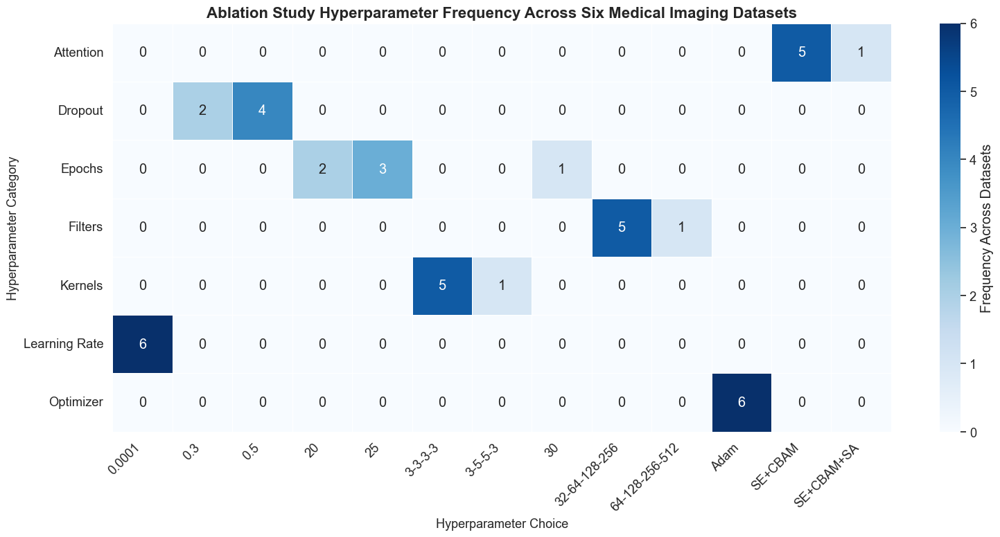

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Frequency dictionary
freq = {
    "Attention": {"SE+CBAM": 5, "SE+CBAM+SA": 1},
    "Dropout": {0.5: 4, 0.3: 2},
    "Optimizer": {"Adam": 6},
    "Learning Rate": {0.0001: 6},
    "Epochs": {20: 2, 25: 3, 30: 1},
    "Filters": {"32-64-128-256": 5, "64-128-256-512": 1},
    "Kernels": {"3-3-3-3": 5, "3-5-5-3": 1}
}

# Convert to dataframe
df = pd.DataFrame([
    [param, option, count]
    for param, options in freq.items()
    for option, count in options.items()
], columns=["Parameter", "Choice", "Frequency"])

# Pivot (correct syntax)
pivot = df.pivot(index="Parameter", columns="Choice", values="Frequency")

# Replace NaN with 0 for a cleaner visualization
pivot = pivot.fillna(0)

# Sort parameters and choices alphabetically for consistency
pivot = pivot.reindex(sorted(pivot.index), axis=0)
pivot = pivot.reindex(sorted(pivot.columns, key=lambda x: str(x)), axis=1)

# Plot
plt.figure(figsize=(16, 8))
sns.set(font_scale=1.2)

sns.heatmap(
    pivot,
    annot=True,
    fmt=".0f",
    linewidths=.5,
    cmap="Blues",
    cbar_kws={'label': 'Frequency Across Datasets'}
)

plt.title("Ablation Study Hyperparameter Frequency Across Six Medical Imaging Datasets", fontsize=16, weight='bold')
plt.xlabel("Hyperparameter Choice", fontsize=13)
plt.ylabel("Hyperparameter Category", fontsize=13)

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()


/var/folders/tv/srl423bx7h12mgvd_zs4ypgr0000gn/T/ipykernel_6740/1729599761.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Hyperparameter', y='Value', data=df_melt, inner='point', palette='Set2')


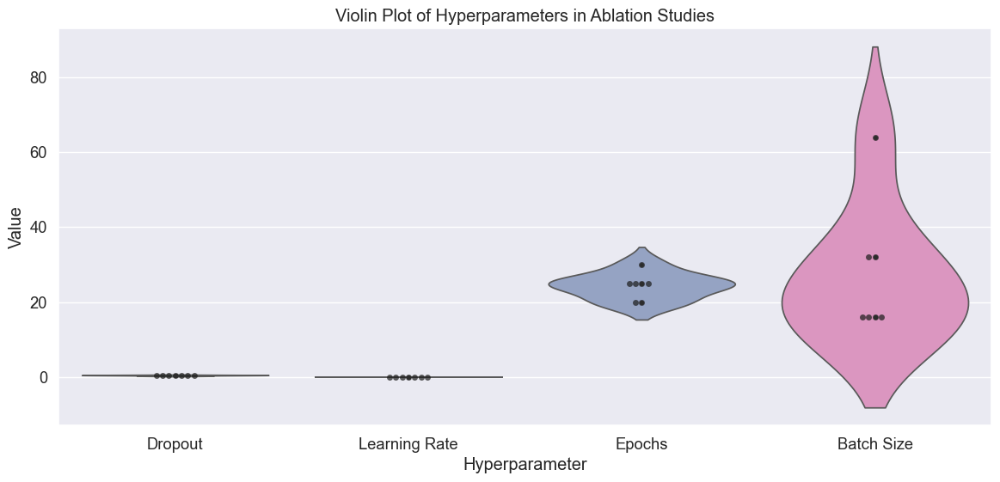

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create the dataset
data = {
    'Dataset': [
        'Kidney CT', 'Acute Lymphoblastic Leukemia (ALL)', 'Lung & Colon Cancer (Histopathology)',
        'Lymphoma', 'Brain Tumor MRI', 'Chest X-ray', 'Final Selected (Voting)'
    ],
    'Attention': [
        'SE + CBAM', 'SE + CBAM', 'SE + CBAM', 'SE + CBAM', 'SE + CBAM + Self-Attention',
        'SE + CBAM', 'SE + CBAM + Self-Attention (final block)'
    ],
    'Dropout': [0.5, 0.3, 0.5, 0.5, 0.5, 0.3, 0.5],
    'Learning Rate': [0.0001, 0.0001, 0.001, 0.001, 0.0001, 0.0001, 0.0001],
    'Epochs': [25, 30, 20, 20, 25, 25, 25],
    'Batch Size': [16, 64, 16, 16, 32, 16, 32]
}

df = pd.DataFrame(data)

# Plot violin plots for Dropout, Learning Rate, Epochs, and Batch Size
plt.figure(figsize=(14, 6))
df_melt = df.melt(id_vars=['Dataset'], value_vars=['Dropout', 'Learning Rate', 'Epochs', 'Batch Size'],
                  var_name='Hyperparameter', value_name='Value')

sns.violinplot(x='Hyperparameter', y='Value', data=df_melt, inner='point', palette='Set2')
sns.swarmplot(x='Hyperparameter', y='Value', data=df_melt, color='k', alpha=0.7)

plt.title('Violin Plot of Hyperparameters in Ablation Studies')
plt.ylabel('Value')
plt.show()
